# Notebook 25: Chapter 6 Figures

This notebook performs a segmentation workflow adapted from NB 11 & 22.
The F50 sand experiment F63 is used to generate figures to be used in Chapter
6 of Gus's thesis.

# Import packages

In [1]:
# Standard library imports
from pathlib import Path
# Third-party imports
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import ndimage as ndi
from scipy import signal
from skimage import color, measure, segmentation
# Local module imports
from segmentflow import segment, view, mesh
# Enable autoreload packages for changes made to local modules
%load_ext autoreload
%autoreload 2

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


## Load 3D data

Passing `slice_crop`, `row_crop`, and `col_crop` to only load part of the dataset

In [2]:
ums_per_pixel = 13.84
# Load images as 3D array from a directory containing images.
imgs = segment.load_images(
    Path('../data/F63tiff/'),
    slice_crop=[400, 550],
    row_crop=[400, 550],
    col_crop=[400, 550],
    file_suffix='tiff'
)

Loading images...
--> Images loaded as 3D array:  (150, 150, 150)


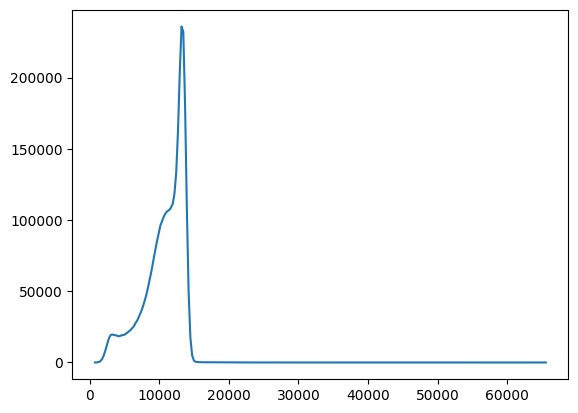

In [3]:
hist, bin_edges = np.histogram(imgs, bins=256)
fig, ax = plt.subplots()
ax.plot(bin_edges[1:], hist)
plt.show()

## Preprocess data

Preprocessing images...
--> Applying median filter...
--> Rescaling intensities to percentile range [0, 99.9]...
--> Preprocessing complete.
Plotting images: [49, 74, 99]


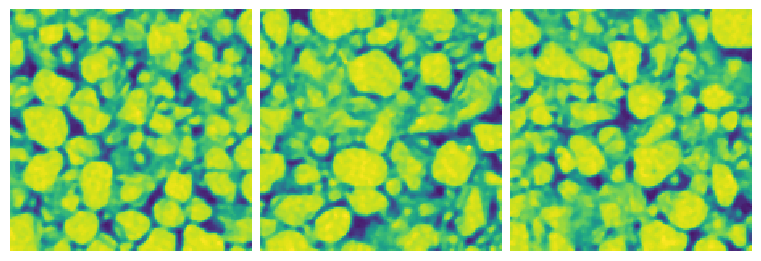

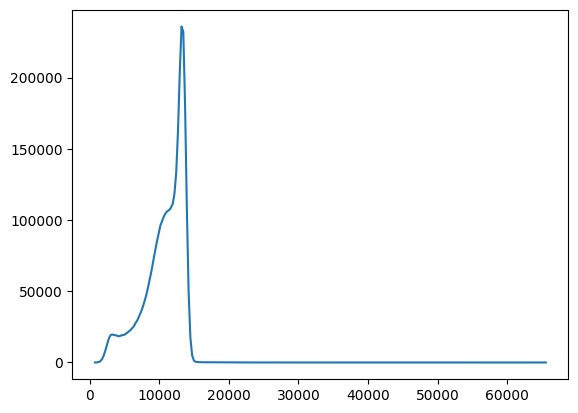

In [4]:
slices = [49, 74, 99]
imgs_pre = segment.preprocess(
    imgs, median_filter=True, rescale_intensity_range=[0, 99.9]
)
fig, axes = view.plot_slices(imgs_pre, slices=slices)
fig, ax = plt.subplots()
ax.plot(bin_edges[1:], hist)
plt.show()

--> 3 peak(s) found: [11796.300000000001, 47840.55, 59636.85]
--> 2 min(s) found: [12451.65, 51117.3]


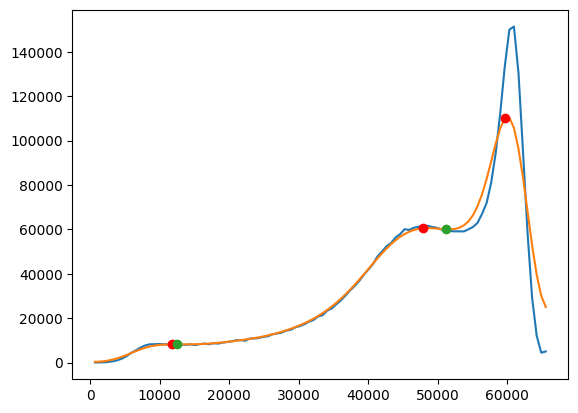

In [5]:
fig, ax = plt.subplots()
nbins = 100
# Calculate histogram
hist, bins = np.histogram(imgs_pre, bins=nbins)
ax.plot(bins[1:], hist)
# Smooth histogram with Gaussian filter
hist_smooth = ndi.gaussian_filter(hist, 3)
ax.plot(bins[1:], hist_smooth, c='C1')
# Find local maxima in smoothed histogram
peak_inds, peak_props = signal.find_peaks(hist_smooth)
peaks = [bins[i] for i in peak_inds]
print(f'--> {len(peaks)} peak(s) found: {peaks}')
for i, val in zip(peak_inds, peaks):
    ax.scatter(val, hist_smooth[i], color='red', zorder=2)
# Find minima between each neighboring pair of local maxima
min_inds = []
for i in range(1, len(peak_inds)):
    min_sub_i = np.argmin(hist_smooth[peak_inds[i - 1] : peak_inds[i]])
    min_inds.append(min_sub_i + peak_inds[i - 1])
mins = [bins[i] for i in min_inds]
print(f'--> {len(mins)} min(s) found: {mins}')
for i, val in zip(min_inds, mins):
    ax.scatter(val, hist_smooth[i], color='C2', zorder=2)
plt.show()

In [6]:
imgs_semantic = segment.isolate_classes(imgs_pre, mins)
n_vox_binder = (imgs_semantic == 1).sum()
print(f'{n_vox_binder=}')
n_vox_grains = (imgs_semantic == 2).sum()
print(f'{n_vox_grains=}')
n_vox_nonvoid = (imgs_semantic > 0).sum()
print(f'{n_vox_nonvoid=}')

n_vox_binder=1669941
n_vox_grains=1616107
n_vox_nonvoid=3286048


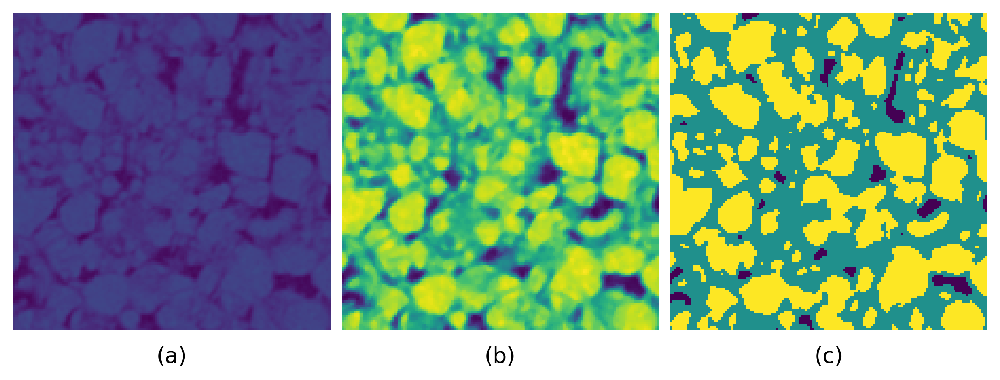

In [7]:
slice_i = 124
img_seq = [img[slice_i, ...] for img in [imgs, imgs_pre, imgs_semantic]]
fig, axes = view.plot_images(
    img_seq, vmin=(imgs.min(), None, None), vmax=(imgs.max(), None, None),
    subplot_letters=True, dpi=300)

## Segment Data

### Single segmentation

Segmenting images...
--> Segmentation complete. 649 particle(s) segmented.


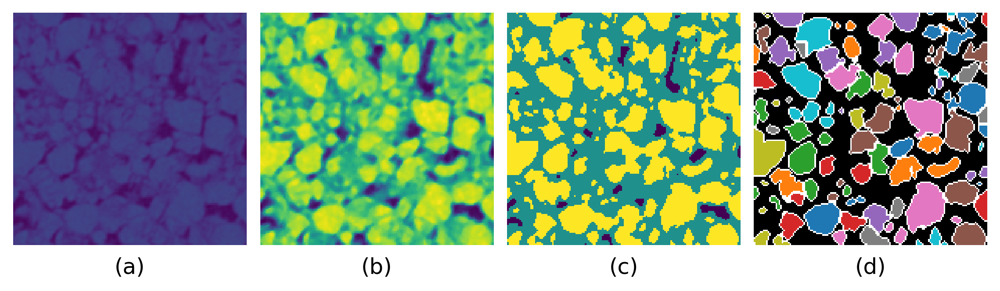

In [9]:
imgs_labeled = segment.watershed_segment(
    imgs_semantic == 2,
    min_peak_distance=6,
    return_dict=False
)
colors = view.get_colors(10, cmap=mpl.cm.tab10)
label_img = imgs_labeled[slice_i, ...]
labels_colored = (
    color.label2rgb(label_img, bg_label=0, colors=colors))
labels_colored = (
    segmentation.mark_boundaries(labels_colored, label_img, color=(1, 1, 1))
)
img_seq = [img[slice_i, ...] for img in [imgs, imgs_pre, imgs_semantic]]
img_seq.append(labels_colored)
fig, axes = view.plot_images(
    img_seq,
    vmin=(imgs.min(), None, None, None),
    vmax=(imgs.max(), None, None, None),
    subplot_letters=True, dpi=300
)

### Multiple segmentations

Segmenting images...
--> Segmentation complete. 878 particle(s) segmented.
Segmenting images...
--> Segmentation complete. 649 particle(s) segmented.
Segmenting images...
--> Segmentation complete. 520 particle(s) segmented.


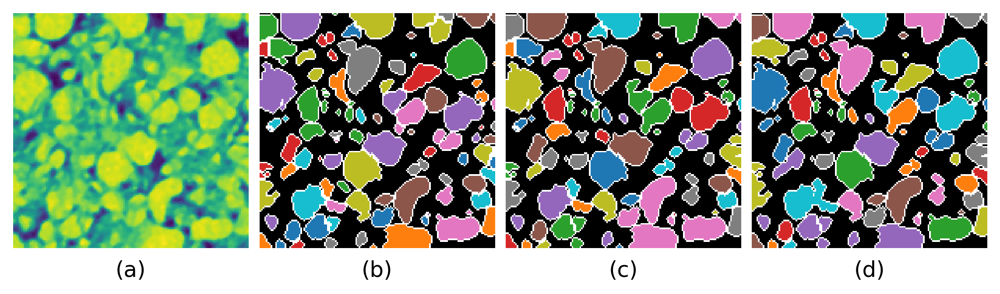

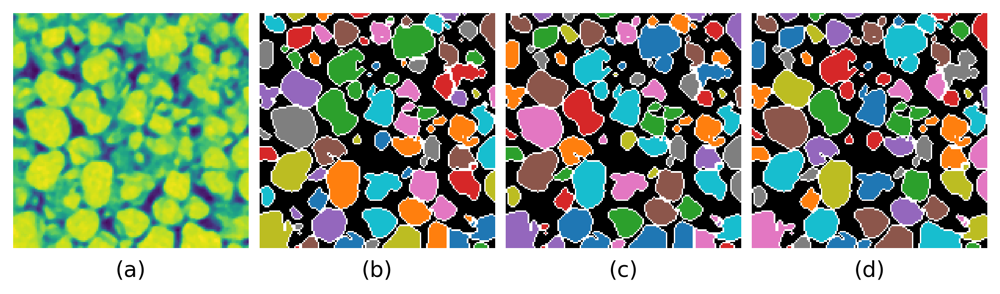

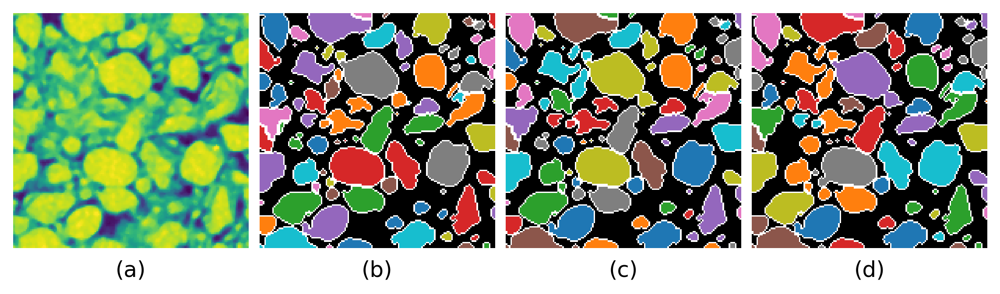

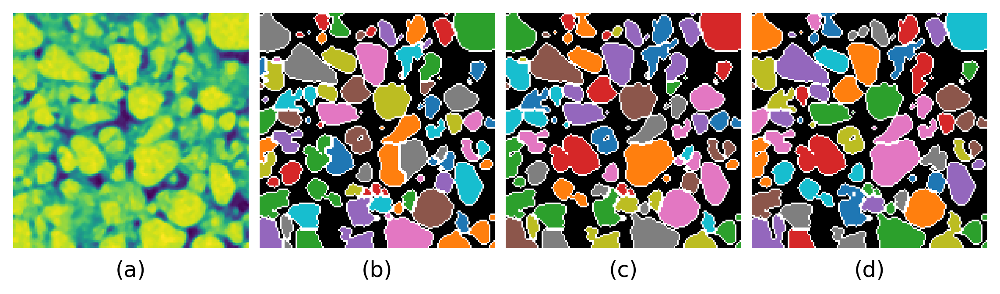

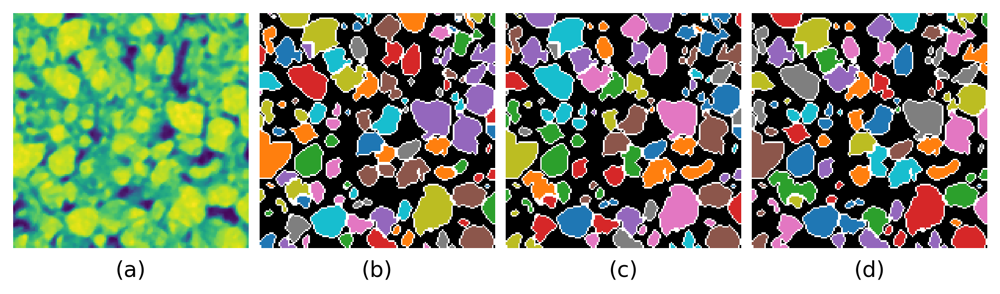

In [55]:
slices = [24, 49, 74, 99, 124]
imgs_labeled_dict = {}
for dist_i in np.arange(5, 8):
    imgs_labeled = segment.watershed_segment(
        imgs_semantic == 2,
        min_peak_distance=dist_i,
        return_dict=False
    )
    imgs_labeled_dict[dist_i] = imgs_labeled
for slice_i in slices:
    img_seq = [imgs_pre[slice_i, ...]]
    for dist_i in np.arange(5, 8):
        imgs_labeled = imgs_labeled_dict[dist_i]
        colors = view.get_colors(10, cmap=mpl.cm.tab10)
        label_img = imgs_labeled[slice_i, ...]
        labels_colored = (
            color.label2rgb(label_img, bg_label=0, colors=colors))
        labels_colored = (
            segmentation.mark_boundaries(labels_colored, label_img, color=(1, 1, 1))
        )
        img_seq.append(labels_colored)
    fig, axes = view.plot_images(img_seq, dpi=300, subplot_letters=True)
    plt.show()

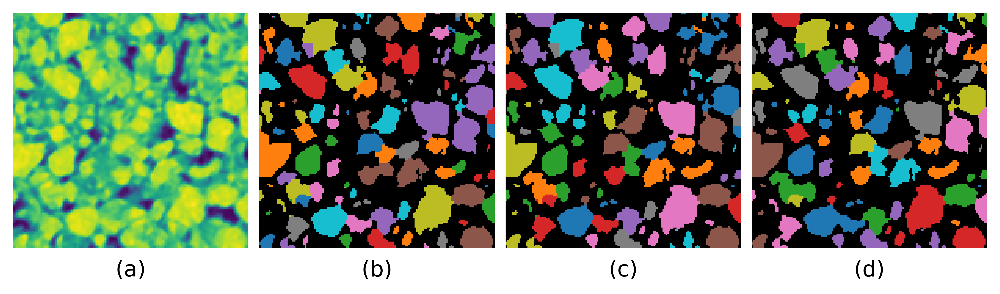

In [110]:
slice_i = 124
img_seq = [imgs_pre[slice_i, ...]]
colors = view.get_colors(10, cmap=mpl.cm.tab10)
for imgs_labeled in imgs_labeled_dict.values():
    label_img = imgs_labeled[slice_i, ...]
    labels_colored = (
        color.label2rgb(label_img, bg_label=0, colors=colors))
    # labels_colored = (
    #     segmentation.mark_boundaries(labels_colored, label_img, color=(1, 1, 1))
    # )
    img_seq.append(labels_colored)
fig, axes = view.plot_images(img_seq, dpi=600, subplot_letters=True)

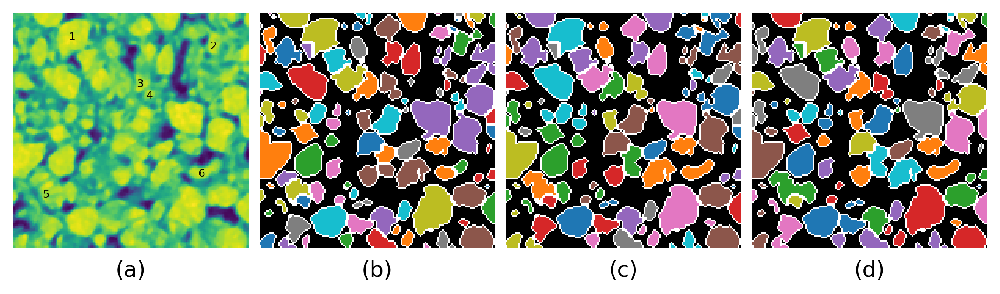

In [102]:
fig, axes = view.plot_images(img_seq, dpi=300, subplot_letters=True)
labels = {
    1  : (0.250, 0.920),
    2  : (0.850, 0.880),
    3  : (0.540, 0.720),
    4  : (0.580, 0.670),
    5  : (0.140, 0.250),
    6  : (0.800, 0.340),
}
for k, v in labels.items():
    axes[0].annotate(
        k, xy=v, size=6, xycoords='axes fraction', ha='center', va='top')

## View slice after segmentation of full volume

Loading images...
--> Images loaded as 3D array:  (390, 1024, 1004)
Preprocessing images...
--> Applying median filter...
--> Rescaling intensities to percentile range [0, 99.9]...
--> Preprocessing complete
--> 3 peak(s) found: [11796.300000000001, 50461.950000000004, 58326.15]
--> 2 min(s) found: [19660.5, 52428.0]


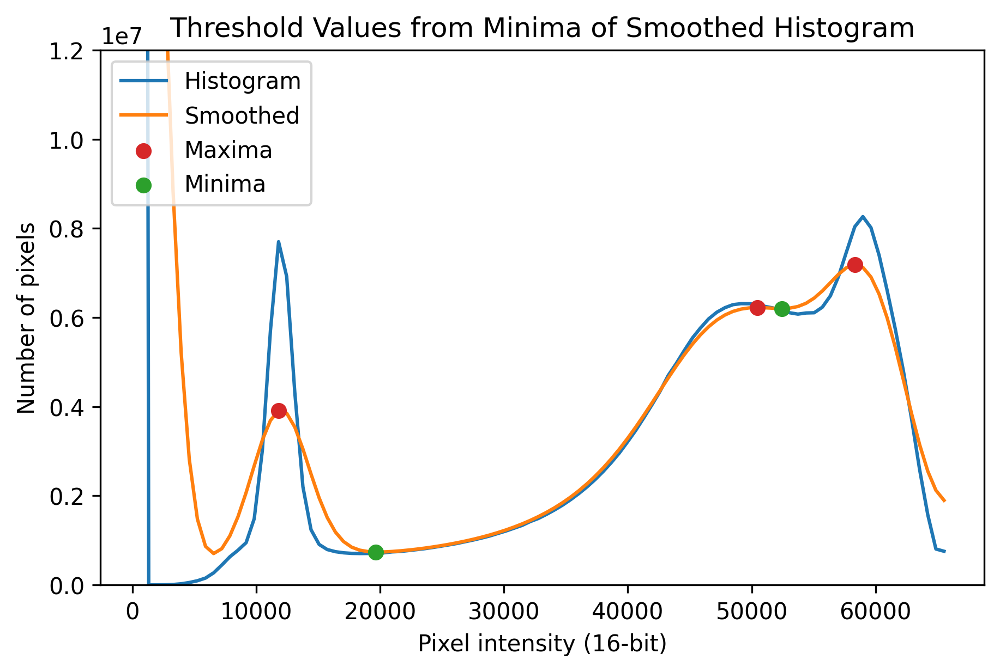

Segmenting images...
--> Segmentation complete. 42072 particle(s) segmented.


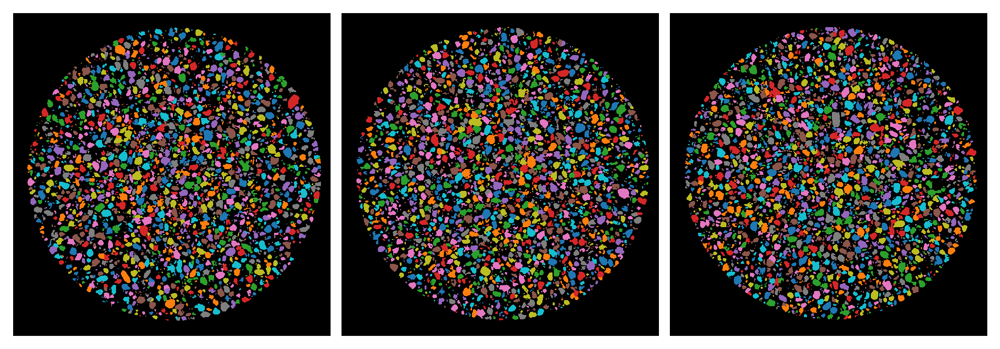

In [112]:
ums_per_pixel = 13.84
# Load images as 3D array from a directory containing images
imgs = segment.load_images(
    Path('../data/F63tiff/'),
    slice_crop=[280, 670],
    row_crop=None,
    col_crop=None,
    convert_to_float=True,
    file_suffix='tiff'
)
# Preprocess
imgs_pre = segment.preprocess(
    imgs, median_filter=True, rescale_intensity_range=[0, 99.9]
)
# Calculate semantic seg
fig, ax = plt.subplots(constrained_layout=True, dpi=300)
nbins = 100
# Calculate histogram
hist, bins = np.histogram(imgs_pre, bins=nbins)
ax.plot(bins[1:], hist, label='Histogram')
# Smooth histogram with Gaussian filter
hist_smooth = ndi.gaussian_filter(hist, 3)
ax.plot(bins[1:], hist_smooth, c='C1', label='Smoothed')
# Find local maxima in smoothed histogram
peak_inds, peak_props = signal.find_peaks(hist_smooth)
peaks = [bins[1 + i] for i in peak_inds]
print(f'--> {len(peaks)} peak(s) found: {peaks}')
ax.scatter(
    peaks, [hist_smooth[i] for i in peak_inds],
    color='C3', zorder=2, label='Maxima')
# Find minima between each neighboring pair of local maxima
min_inds = []
for i in range(1, len(peak_inds)):
    min_sub_i = np.argmin(hist_smooth[peak_inds[i - 1] : peak_inds[i]])
    min_inds.append(min_sub_i + peak_inds[i - 1])
mins = [bins[1 + i] for i in min_inds]
print(f'--> {len(mins)} min(s) found: {mins}')
ax.scatter(
    mins, [hist_smooth[i] for i in min_inds],
    color='C2', zorder=2, label='Minima')
ax.set_title('Threshold Values from Minima of Smoothed Histogram')
ax.set_ylim([0, 1.2e7])
ax.set_ylabel('Number of pixels')
ax.set_xlabel('Pixel intensity (16-bit)')
ax.legend(loc='upper left')
plt.show()
imgs_semantic = segment.isolate_classes(imgs_pre, mins)
# Segment data
imgs_labeled = segment.watershed_segment(
    imgs_semantic == 2,
    min_peak_distance=6,
    return_dict=False
)
colors = view.get_colors(10, cmap=mpl.cm.tab10)
slices = [44, 144, 244]
labeled_color = [
    color.label2rgb(imgs_labeled[i, ...], bg_label=0, colors=colors)
    for i in slices
]
fig, axes = view.plot_images(labeled_color, dpi=300)
plt.show()

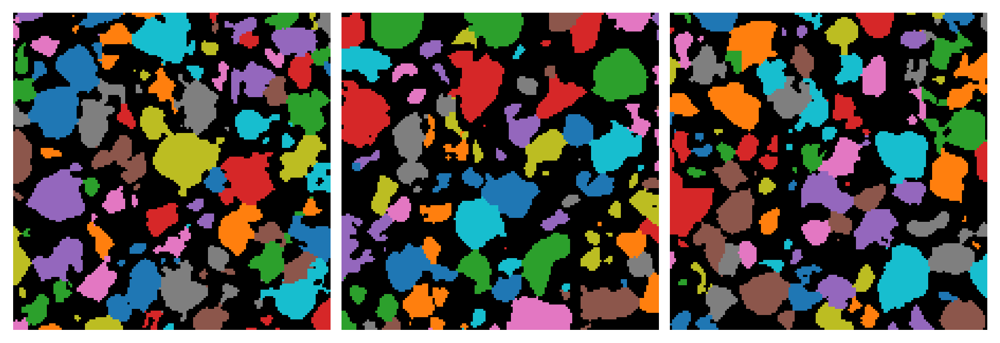

In [114]:
cropped_color_labels = [
    color.label2rgb(
        imgs_labeled[i, 400:550, 400:550], bg_label=0, colors=colors
    ) for i in slices
]
fig, axes = view.plot_images(cropped_color_labels, dpi=300)
plt.show()

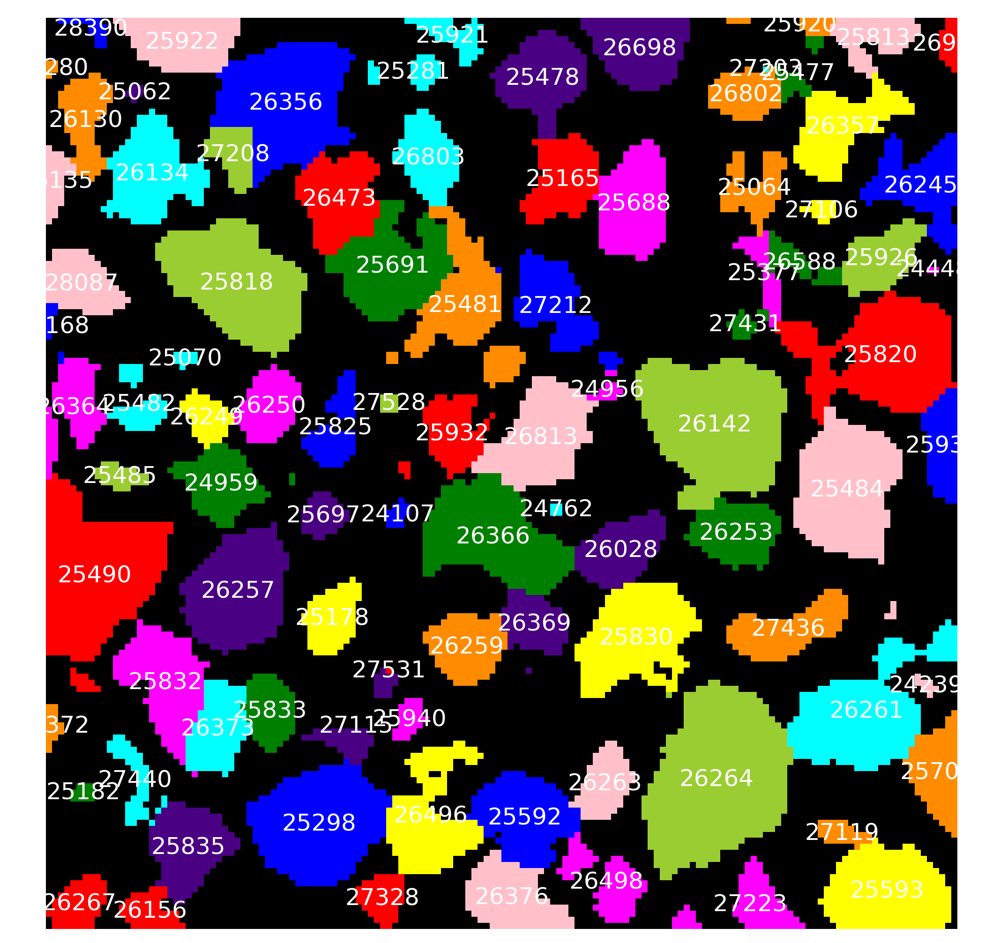

In [118]:
fig, axes = view.plot_particle_labels(
    imgs_labeled[:, 400:550, 400:550], 244, use_color_labels=True, dpi=300)

## Create STL files for full sample

In [119]:
segment.save_as_stl_files(
    imgs_labeled,
    Path('../data'),
    'F63-slices_280_to_670-min_peak_dist-6',
    spatial_res=ums_per_pixel
)

Generating surface meshes...
Creating surface mesh with marching cubes algorithm...
Converting mesh to STL format...
Creating surface mesh with marching cubes algorithm...
Converting mesh to STL format...
Creating surface mesh with marching cubes algorithm...
Converting mesh to STL format...
Creating surface mesh with marching cubes algorithm...
Converting mesh to STL format...
Creating surface mesh with marching cubes algorithm...
Converting mesh to STL format...
Creating surface mesh with marching cubes algorithm...
Converting mesh to STL format...
Creating surface mesh with marching cubes algorithm...
Converting mesh to STL format...
Creating surface mesh with marching cubes algorithm...
Converting mesh to STL format...
Surface mesh not created for particle 9: Particle smaller than minimum width in at least one dimension.
Creating surface mesh with marching cubes algorithm...
Converting mesh to STL format...
Creating surface mesh with marching cubes algorithm...
Surface mesh not cre

## Multiple full segs on slice 525

Segmenting images...
--> Segmentation complete. 878 particle(s) segmented.
Segmenting images...
--> Segmentation complete. 649 particle(s) segmented.
Segmenting images...
--> Segmentation complete. 520 particle(s) segmented.


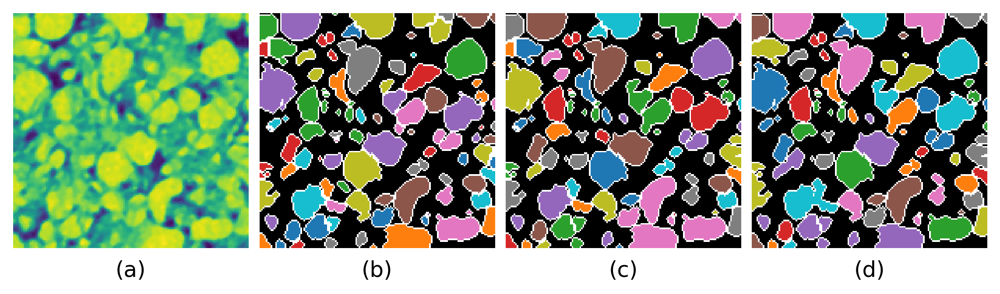

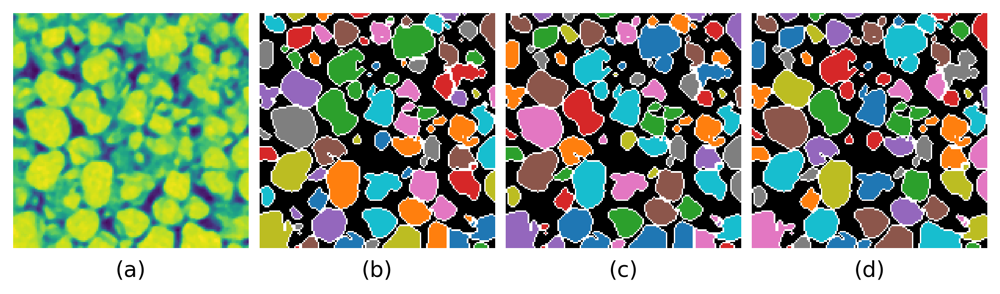

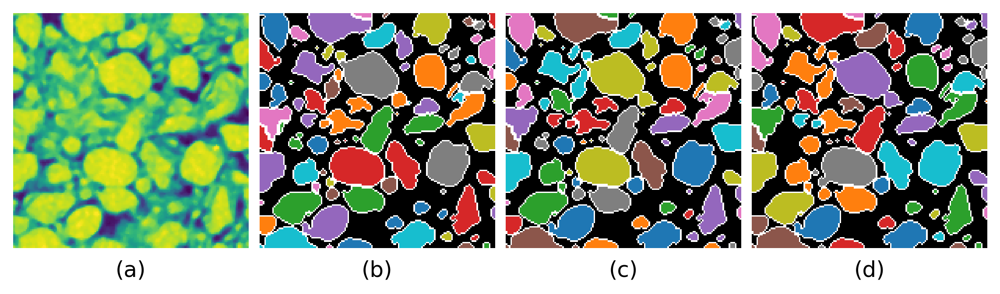

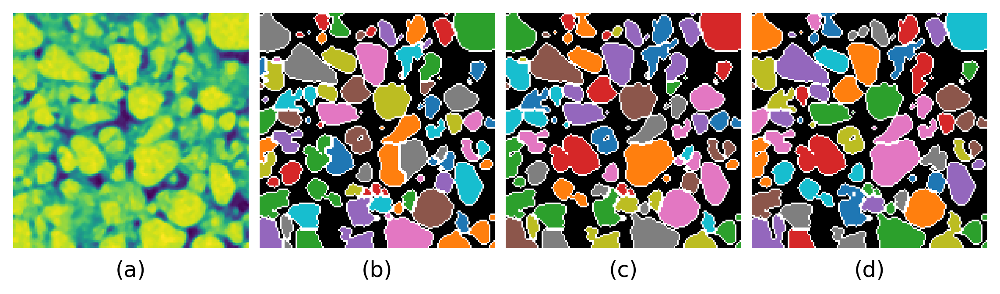

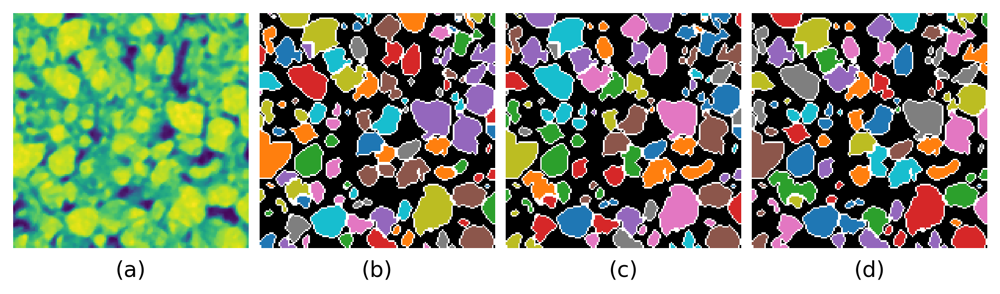

In [ ]:
slices = [24, 49, 74, 99, 124]
imgs_labeled_dict = {}
for dist_i in np.arange(5, 8):
    imgs_labeled = segment.watershed_segment(
        imgs_semantic == 2,
        min_peak_distance=dist_i,
        return_dict=False
    )
    imgs_labeled_dict[dist_i] = imgs_labeled
for slice_i in slices:
    img_seq = [imgs_pre[slice_i, ...]]
    for dist_i in np.arange(5, 8):
        imgs_labeled = imgs_labeled_dict[dist_i]
        colors = view.get_colors(10, cmap=mpl.cm.tab10)
        label_img = imgs_labeled[slice_i, ...]
        labels_colored = (
            color.label2rgb(label_img, bg_label=0, colors=colors))
        labels_colored = (
            segmentation.mark_boundaries(labels_colored, label_img, color=(1, 1, 1))
        )
        img_seq.append(labels_colored)
    fig, axes = view.plot_images(img_seq, dpi=300, subplot_letters=True)
    plt.show()

Segmenting images...
--> Segmentation complete. 56595 particle(s) segmented.
Segmenting images...
--> Segmentation complete. 42072 particle(s) segmented.
Segmenting images...
--> Segmentation complete. 32692 particle(s) segmented.


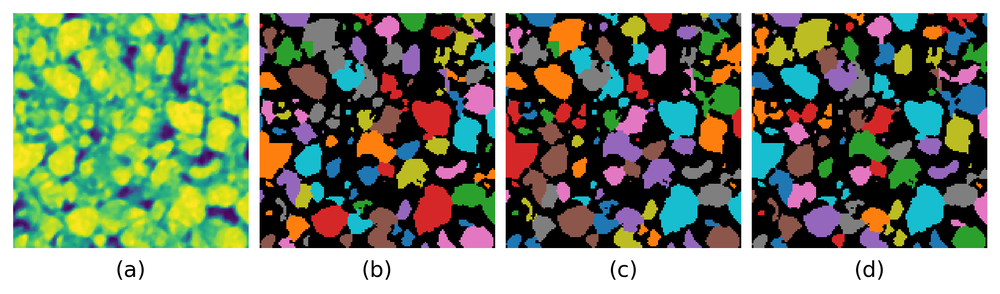

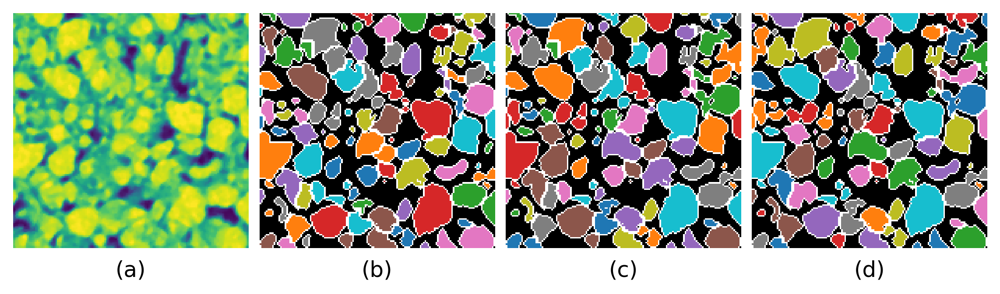

In [121]:
# Original iamge 124 (starting at 400), so starting at 280 -> 244
slice_i = 244
colors = view.get_colors(10, cmap=mpl.cm.tab10)
img_seq = [imgs_pre[slice_i, 400:550, 400:550]]
img_seq2 = [imgs_pre[slice_i, 400:550, 400:550]]
for dist_i in np.arange(5, 8):
    imgs_labeled = segment.watershed_segment(
        imgs_semantic == 2,
        min_peak_distance=dist_i,
        return_dict=False
    )
    label_img = imgs_labeled[slice_i, 400:550, 400:550]
    labels_colored = (
        color.label2rgb(label_img, bg_label=0, colors=colors))
    img_seq.append(labels_colored)
    labels_bound = (
        segmentation.mark_boundaries(labels_colored, label_img, color=(1, 1, 1))
    )
    img_seq2.append(labels_bound)
fig, axes = view.plot_images(img_seq, dpi=300, subplot_letters=True)
fig, axes = view.plot_images(img_seq2, dpi=300, subplot_letters=True)
plt.show()

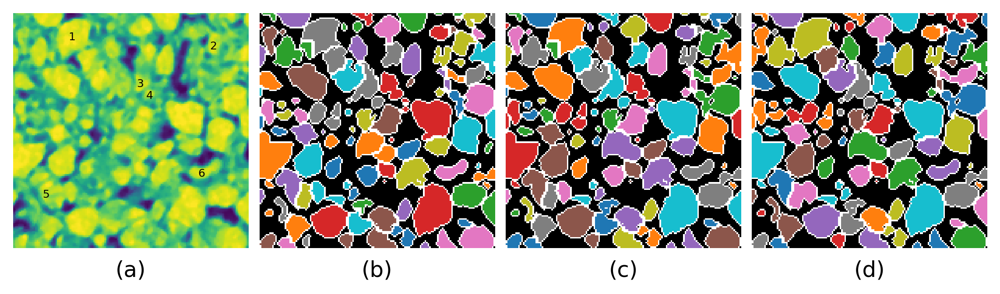

In [173]:
fig, axes = view.plot_images(img_seq2, dpi=300, subplot_letters=True)
labels = {
    1  : (0.250, 0.920),
    2  : (0.850, 0.880),
    3  : (0.540, 0.720),
    4  : (0.580, 0.670),
    5  : (0.140, 0.250),
    6  : (0.800, 0.340),
}
for k, v in labels.items():
    axes[0].annotate(
        k, xy=v, size=6, xycoords='axes fraction', ha='center', va='top')

## Process mesh 26259

In [26]:
label = 26259
prefix = 'F63-slices_280_to_670-min_peak_dist-6'
stl_dir_path = Path(f'../data/{prefix}_STLs')
stl_path = Path(stl_dir_path) / f'{prefix}_{label}.stl'
print(stl_path.exists())
# Load the mesh, smooth, and save
stl_mesh, mesh_props = mesh.postprocess_mesh(
    stl_path,
    smooth_iter=1,
    simplify_n_tris=None,
    iterative_simplify_factor=2,
    recursive_simplify=False,
    resave_mesh=False
)
n_tris = mesh_props['n_triangles']
print('Smoothed n_tris:', n_tris)
mesh.save_stl(
    Path(
        f'../data/F63-280_to_670-d6-{label}'
        f'/{label}-smoothed-{n_tris}_tris.stl'
    ),
    stl_mesh,
    mkdirs=True
)
# Load the mesh, smooth/simplify, and save
stl_mesh, mesh_props = mesh.postprocess_mesh(
    stl_path,
    smooth_iter=1,
    simplify_n_tris=2000,
    iterative_simplify_factor=2,
    recursive_simplify=False,
    resave_mesh=False
)
n_tris = mesh_props['n_triangles']
print('Simplified to 2000 n_tris:', n_tris)
mesh.save_stl(
    Path(
        f'../data/F63-280_to_670-d6-{label}'
        f'/{label}-simplified-{n_tris}_tris.stl'
    ),
    stl_mesh
)
# Load the mesh, smooth/simplify, and save
stl_mesh, mesh_props = mesh.postprocess_mesh(
    stl_path,
    smooth_iter=1,
    simplify_n_tris=200,
    iterative_simplify_factor=2,
    recursive_simplify=False,
    resave_mesh=False
)
n_tris = mesh_props['n_triangles']
print('Simplified to 200 n_tris:', n_tris)
mesh.save_stl(
    Path(
        f'../data/F63-280_to_670-d6-{label}'
        f'/{label}-simplified-{n_tris}_tris.stl'
    ),
    stl_mesh
)
# Load the mesh, smooth/simplify, and save
stl_mesh, mesh_props = mesh.postprocess_mesh(
    stl_path,
    smooth_iter=1,
    simplify_n_tris=20,
    iterative_simplify_factor=2,
    recursive_simplify=False,
    resave_mesh=False
)
n_tris = mesh_props['n_triangles']
print('Simplified to 20 n_tris:', n_tris)
mesh.save_stl(
    Path(
        f'../data/F63-280_to_670-d6-{label}'
        f'/{label}-simplified-{n_tris}_tris.stl'
    ),
    stl_mesh
)

True
Smoothed n_tris: 1524
STL saved: ..\data\F63-280_to_670-d6-26259\26259-smoothed-1524_tris.stl
Simplified to 2000 n_tris: 1524
STL saved: ..\data\F63-280_to_670-d6-26259\26259-simplified-1524_tris.stl
Simplified to 200 n_tris: 190
STL saved: ..\data\F63-280_to_670-d6-26259\26259-simplified-190_tris.stl
Simplified to 20 n_tris: 10
STL saved: ..\data\F63-280_to_670-d6-26259\26259-simplified-10_tris.stl


In [30]:
prefix = 'F63-slices_280_to_670-min_peak_dist-6'
stl_dir_path = Path(f'../data/{prefix}_STLs')
mesh.postprocess_meshes(
    stl_dir_path,
    smooth_iter=1,
    simplify_n_tris=200,
    iterative_simplify_factor=2,
    recursive_simplify=False,
    suppress_save_message=False,
    resave_mesh=False,
    save_dir_path=Path('../data/F63-280_to_670-d6-simp_200')
)

Postprocessing surface meshes...
STL saved: ..\data\F63-280_to_670-d6-simp_200\00000.stl
STL saved: ..\data\F63-280_to_670-d6-simp_200\00001.stl
STL saved: ..\data\F63-280_to_670-d6-simp_200\00002.stl
STL saved: ..\data\F63-280_to_670-d6-simp_200\00003.stl
STL saved: ..\data\F63-280_to_670-d6-simp_200\00004.stl
STL saved: ..\data\F63-280_to_670-d6-simp_200\00005.stl
STL saved: ..\data\F63-280_to_670-d6-simp_200\00006.stl
STL saved: ..\data\F63-280_to_670-d6-simp_200\00007.stl
STL saved: ..\data\F63-280_to_670-d6-simp_200\00008.stl
STL saved: ..\data\F63-280_to_670-d6-simp_200\00009.stl
STL saved: ..\data\F63-280_to_670-d6-simp_200\00010.stl
STL saved: ..\data\F63-280_to_670-d6-simp_200\00011.stl
STL saved: ..\data\F63-280_to_670-d6-simp_200\00012.stl
STL saved: ..\data\F63-280_to_670-d6-simp_200\00013.stl
STL saved: ..\data\F63-280_to_670-d6-simp_200\00014.stl
STL saved: ..\data\F63-280_to_670-d6-simp_200\00015.stl
STL saved: ..\data\F63-280_to_670-d6-simp_200\00016.stl
STL saved: ..\d